In [90]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import gridspec
import seaborn as sns
import cooler
from matplotlib import gridspec
from scipy.stats import pearsonr, spearmanr, gaussian_kde
import warnings
warnings.filterwarnings('ignore')
from IPython.display import clear_output
import bioframe
from cooltools import saddle
from cooltools import numutils
import warnings
warnings.filterwarnings('ignore')
import bioframe
from gtfparse import read_gtf

In [3]:
def open_eigenvector(tsv_path, chromosome, pc_num):
    pc1 = pd.read_csv(tsv_path, sep = '\t', header = 0)
    pc1 = pc1[pc1['chrom'] == 'chr' + chromosome]['E' + pc_num].values
    pc1 = np.nan_to_num(pc1)
    gc_content = pd.read_csv('/DATA/users/magnitov/genomes/hg38.gc_content.200kb.txt', sep = '\t')
    gc_content = gc_content[gc_content['chrom'] == 'chr' + chromosome]['GC'].values
    gc_content = np.nan_to_num(gc_content)
    if pearsonr(pc1, gc_content)[0] > 0:
        return(pc1)
    else:
        return(-1*(pc1))

## Table with eigenvectors

In [31]:
intervals = pd.read_csv('./compartments/eigs_haarhuis_2017.WT.cis.vecs.tsv', sep = '\t', header = 0).drop(['E1', 'E2', 'E3'], axis = 1)
intervals = intervals[intervals['chrom'] != 'chrY']
intervals = intervals[intervals['chrom'] != 'chrM']

for replicate in ['eigs_haarhuis_2017.WT']:
    eig = []
    for chromosome in ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', 'X']:
        
        eig_tmp = open_eigenvector('./compartments/' + replicate + '.cis.vecs.tsv', chromosome, '1')
        if chromosome == '21' or chromosome == '15':
            eig_tmp = (-1)*eig_tmp
        if chromosome == '22':
            eig_tmp = open_eigenvector('./compartments/' + replicate + '.cis.vecs.tsv', chromosome, '3')
        if chromosome == '9':
            eig_tmp = open_eigenvector('./compartments/' + replicate + '.cis.vecs.tsv', chromosome, '3')
        eig = np.hstack((eig, eig_tmp))
    intervals[replicate.replace('eigs_', '')] = eig

for replicate in ['eigs_sanborn_2015.WT']:
    eig = []
    for chromosome in ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', 'X']:
        
        eig_tmp = open_eigenvector('./compartments/' + replicate + '.cis.vecs.tsv', chromosome, '1')
        if chromosome == '15':
            eig_tmp = (-1)*eig_tmp
        if chromosome == '9':
            eig_tmp = open_eigenvector('./compartments/' + replicate + '.cis.vecs.tsv', chromosome, '2')
        if chromosome == '22':
            eig_tmp = open_eigenvector('./compartments/' + replicate + '.cis.vecs.tsv', chromosome, '3')
            
        eig = np.hstack((eig, eig_tmp))
    intervals[replicate.replace('eigs_', '')] = eig
    
for replicate in ['eigs_T-MAU2', 'eigs_T-mCherry', 'eigs_T-MAU2_Dox_1H']:
    eig = []
    for chromosome in ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', 'X']:
        eig_tmp = open_eigenvector('./compartments/' + replicate + '.cis.vecs.tsv', chromosome, '1')
        
        if chromosome == '8' or chromosome == '15' or chromosome == '22' or chromosome == '10' or chromosome == '18' or chromosome == '21':
            eig_tmp = (-1)*eig_tmp
            
        eig = np.hstack((eig, eig_tmp))
    intervals[replicate.replace('eigs_', '')] = eig

In [32]:
intervals[intervals.columns[3:]] = intervals[intervals.columns[3:]].replace({0:np.nan})
intervals.to_csv('./compartments/PC1_values.tsv', sep = '\t', header = 1, index = 0)

### RNA-seq in compartments

In [33]:
rnaseq = pd.read_table('./compartments/hap1_rnaseq.200kb.bed', sep = '\s+', 
                       header = None, names = ['chr', 'start', 'end', 'reads'])
rnaseq = rnaseq[~rnaseq['chr'].isin(['chrY', 'chrM'])]['reads'].values
intervals['RNAseq'] = rnaseq

In [34]:
intervals.head()

,chrom,start,end,haarhuis_2017.WT,sanborn_2015.WT,T-MAU2,T-mCherry,T-MAU2_Dox_1H,RNAseq
0,chr1,0,200000,NaN,NaN,NaN,NaN,NaN,767.598654
1,chr1,200000,400000,NaN,NaN,NaN,NaN,NaN,57.146990
2,chr1,400000,600000,NaN,NaN,NaN,NaN,NaN,35.659744
3,chr1,600000,800000,NaN,NaN,NaN,NaN,NaN,26378.620580
4,chr1,800000,1000000,1.214829,1.024059,NaN,NaN,NaN,58465.933080


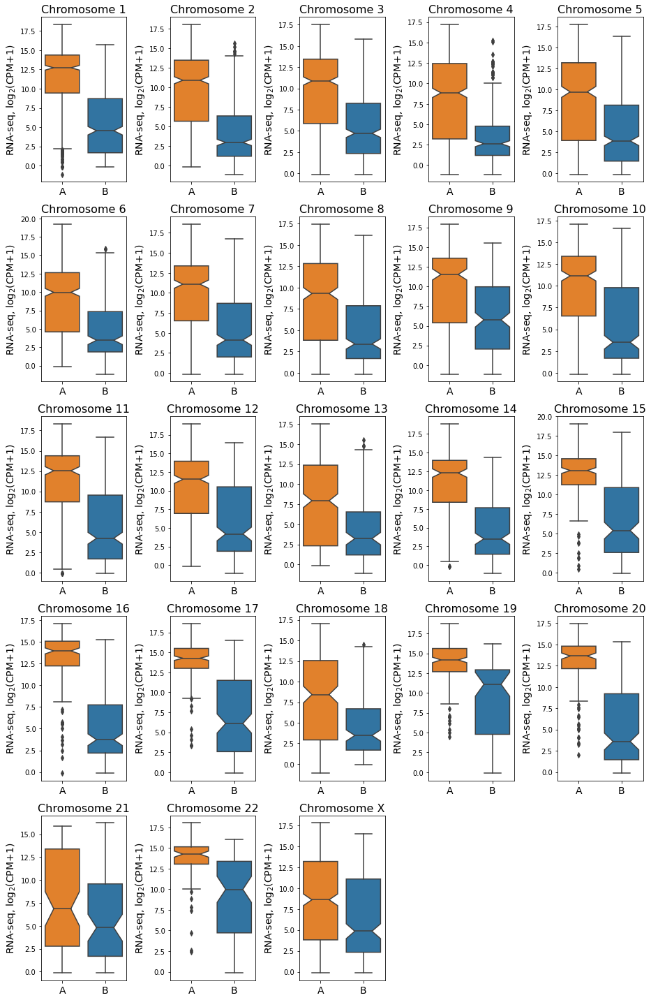

In [35]:
plt.figure(figsize = (13, 20))
i = 1
for chromosome in ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13',
                   '14', '15', '16', '17', '18', '19', '20', '21', '22', 'X']:
    tmp = intervals[intervals['chrom'] == 'chr' + chromosome]
    rna_A = [y for (x, y) in zip(tmp['T-MAU2_Dox_1H'], tmp['RNAseq']) if x>0]
    rna_B = [y for (x, y) in zip(tmp['T-MAU2_Dox_1H'], tmp['RNAseq']) if x<0]
    plt.subplot(5, 5, i)
    sns.boxplot(data = [np.log2(rna_A), np.log2(rna_B)], notch = 1, palette = ['C1', 'C0'])
    plt.title('Chromosome ' + chromosome, fontsize = 16)
    plt.xticks([0, 1], ['A', 'B'], fontsize = 14)
    plt.ylabel('RNA-seq, log$_2$(CPM+1)', fontsize = 14)
    i+=1
plt.tight_layout()
plt.show()

## Plot eigenvector tracks

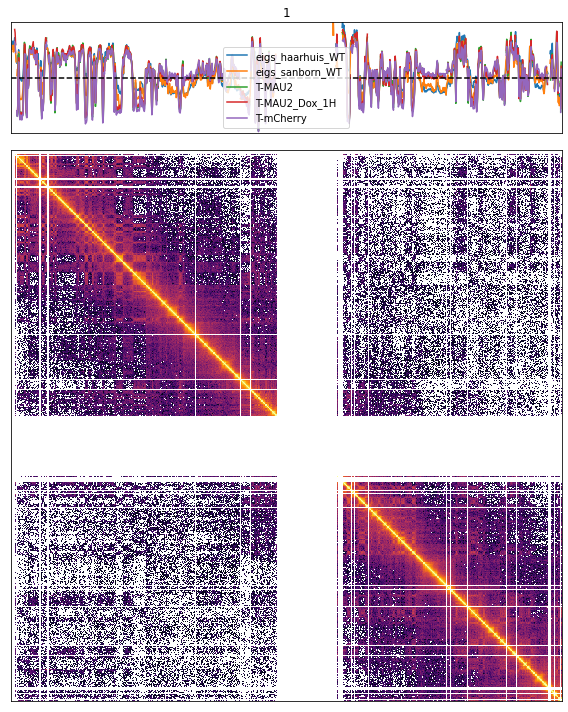

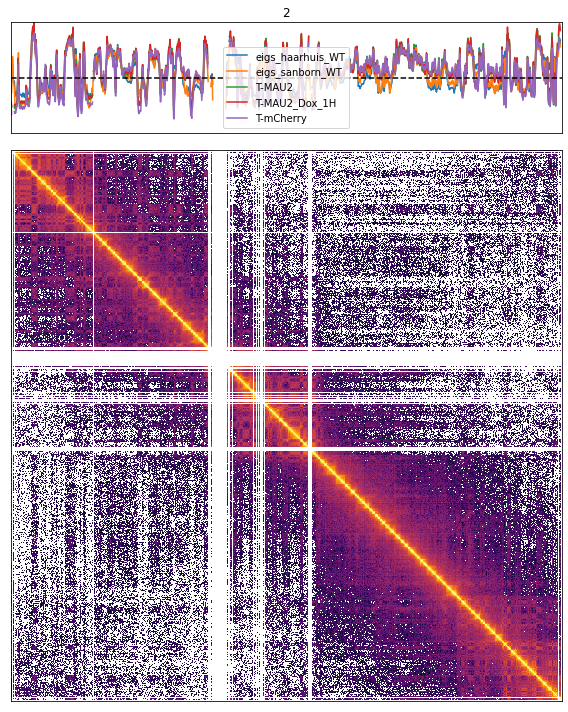

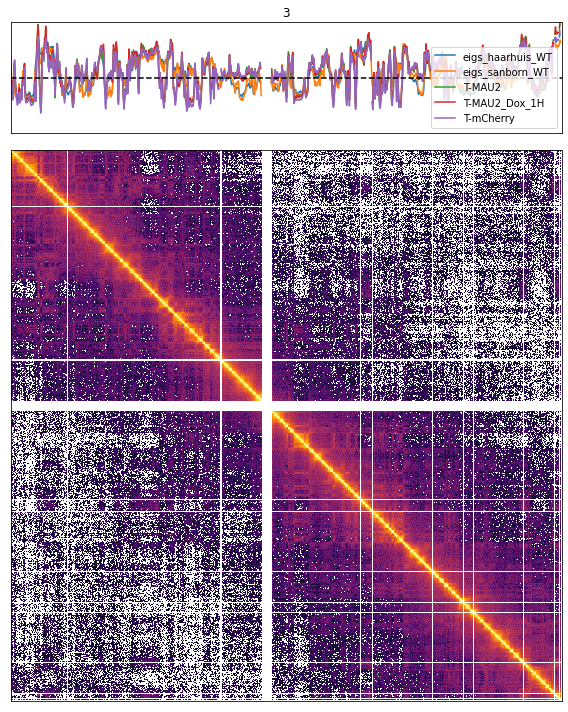

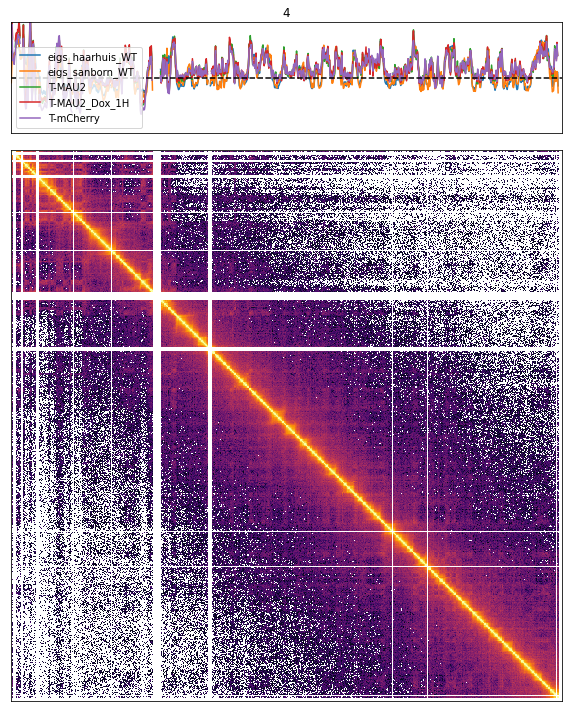

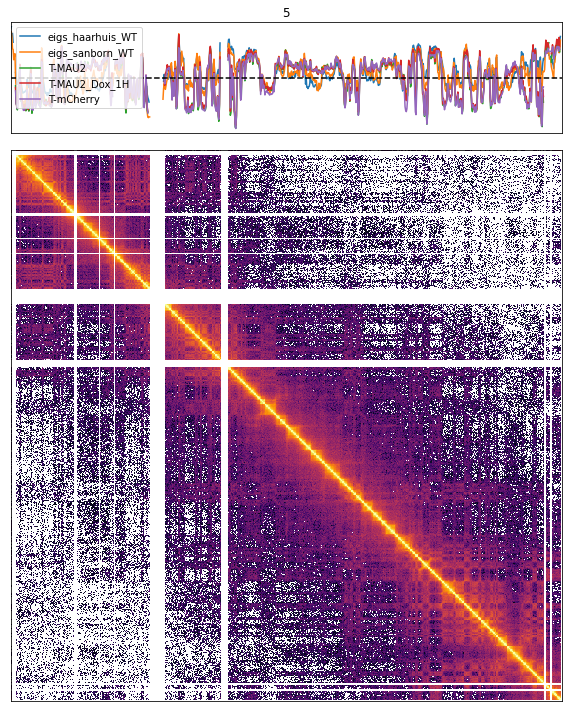

...

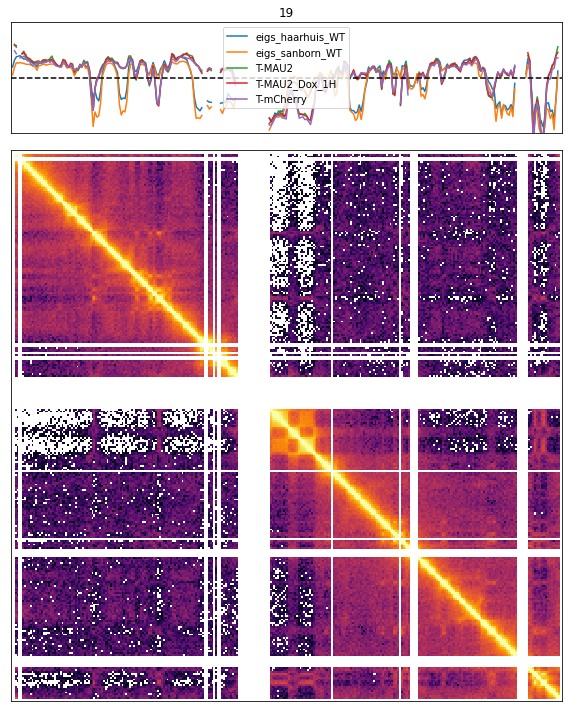

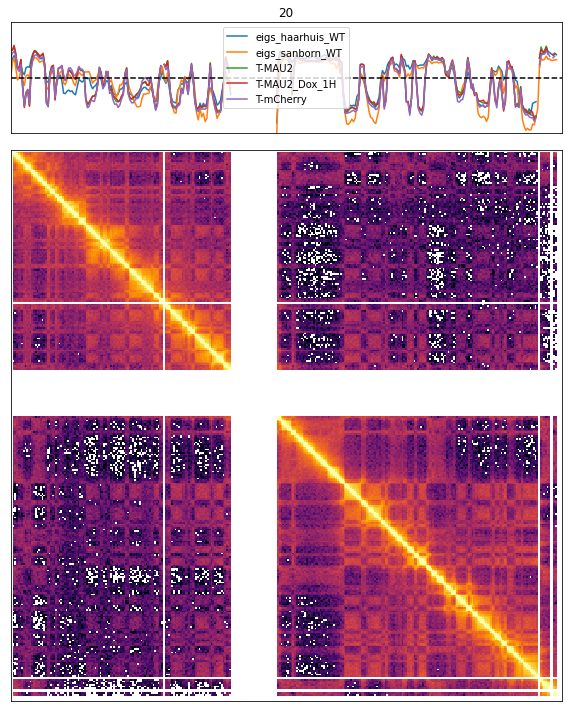

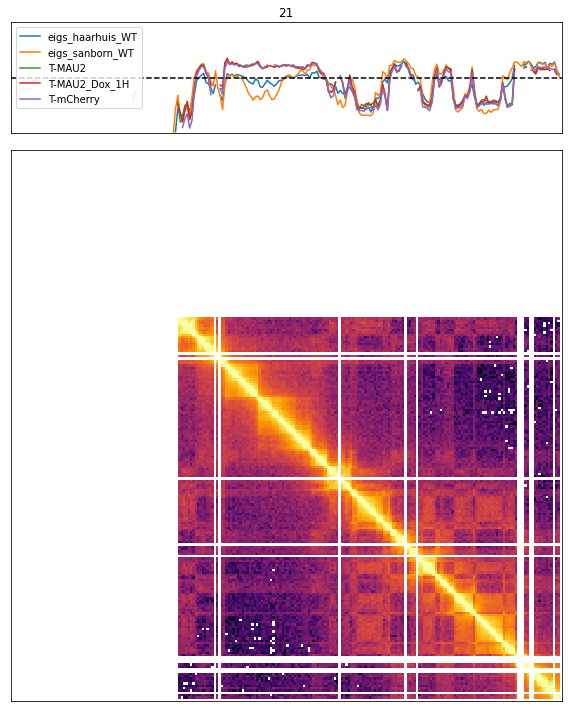

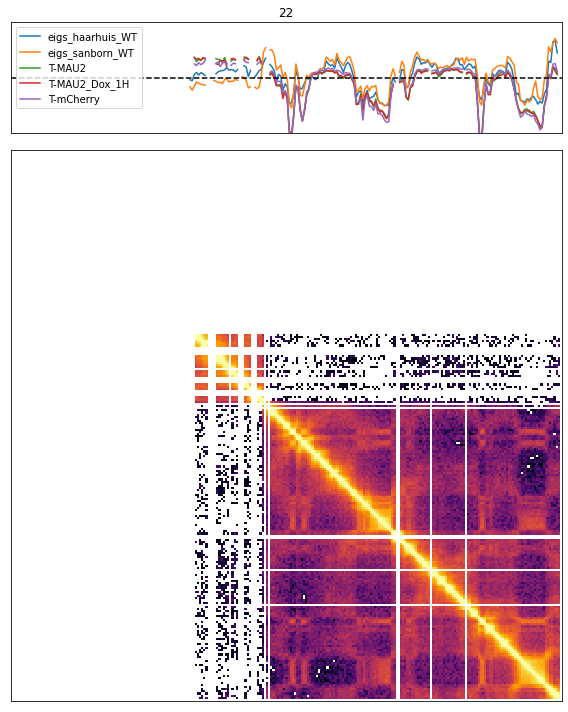

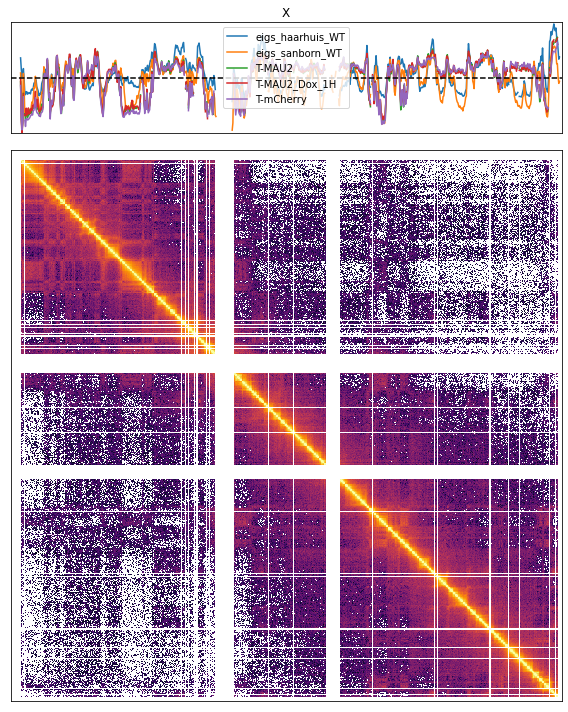

In [36]:
for chromosome in ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', 
                   '11', '12', '13', '14', '15', '16', '17', '18', '19', '20',
                   '21', '22', 'X']:
    
    clr = cooler.Cooler('./coolers/T-MAU2_Dox_1H.hg38.mapq_30.1000.mcool::resolutions/200000')
    
    plt.figure(figsize = (8, 10))
    
    spec = gridspec.GridSpec(ncols = 1, nrows = 2, height_ratios = [1, 5])
    
    plt.subplot(spec[0])
    plt.title(chromosome)
    plt.plot(intervals[intervals['chrom'] == 'chr' + chromosome]['haarhuis_2017.WT'].values, label = 'eigs_haarhuis_WT')
    plt.plot(intervals[intervals['chrom'] == 'chr' + chromosome]['sanborn_2015.WT'].values, label = 'eigs_sanborn_WT')
    plt.plot(intervals[intervals['chrom'] == 'chr' + chromosome]['T-MAU2'].values, label = 'T-MAU2')
    plt.plot(intervals[intervals['chrom'] == 'chr' + chromosome]['T-MAU2_Dox_1H'].values, label = 'T-MAU2_Dox_1H')
    plt.plot(intervals[intervals['chrom'] == 'chr' + chromosome]['T-mCherry'].values, label = 'T-mCherry')
    plt.legend()

    plt.xlim((0, len(intervals[intervals['chrom'] == 'chr' + chromosome])))
    plt.ylim((-2, 2))
    plt.xticks([], [])
    plt.yticks([], [])
    plt.axhline(0, color = 'k', ls = '--')
    
    plt.subplot(spec[1])
    plt.matshow(np.log2(clr.matrix(balance=True).fetch('chr' + chromosome)), fignum = 0, cmap = 'inferno', vmax = -3)
    plt.xticks([], [])
    plt.yticks([], [])
    
    plt.tight_layout()
    plt.show()